In [1]:
import pandas as pd
import numpy as np
import missingno as msno
import ast

import plotly.plotly as py
import plotly.graph_objs as go
import plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot

import cufflinks as cf

from collections import Counter
from sklearn.preprocessing import LabelEncoder

%matplotlib inline
py.offline.init_notebook_mode()

In [2]:
path_movie = "../data/movies_metadata.csv"
df_movie = pd.read_csv(path_movie, quotechar = '"')
df_movie.rename(columns = {"id": "tmdbId"}, inplace = True)

In [3]:
# Some movies are in double
print(len(df_movie))
print(len(df_movie['tmdbId'].unique()))

45463
45433


In [4]:
df_doubles = df_movie.groupby("tmdbId").size().reset_index()
list_doubles = df_doubles[df_doubles[0]>1]["tmdbId"].tolist()

# df_movie[df_movie['tmdbId'].isin(list_doubles)].sort_values(by ="tmdbId" ).head()

In [5]:
df_movie = df_movie.drop_duplicates("imdb_id")

In [6]:
# Check missing values
df_movie.isnull().sum()

adult                        0
belongs_to_collection    40931
budget                       0
genres                       0
homepage                 37644
tmdbId                       0
imdb_id                      1
original_language           11
original_title               0
overview                   952
popularity                   0
poster_path                378
production_companies         0
production_countries         0
release_date                81
revenue                      0
runtime                    255
spoken_languages             0
status                      81
tagline                  25018
title                        0
video                        0
vote_average                 0
vote_count                   0
dtype: int64

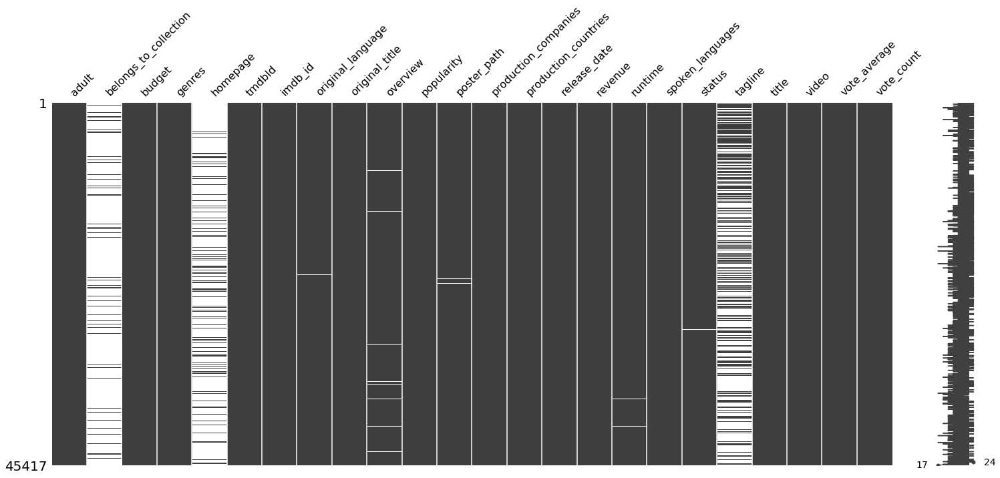

In [7]:
msno.matrix(df_movie)

In [8]:
# List all genres
list_all = []
for i in df_movie["genres"]:
    split_genre = [x['name'] for x in ast.literal_eval(i)]
    for j in split_genre:
        list_all.append(j)          

# counter = Counter(list_all)
# dict_count_genre = dict(counter)
# top_genres = sorted(dict_count_genre, key=dict_count_genre.get, reverse=True)[:10]

# for word in top_genres:
#     df_movie[word] = df_movie['genres'].map(lambda s: 1 if word in str(s) else 0)

In [9]:
# Histogram of most represented genres
x = list_all
data = [go.Histogram(x=x)]
iplot(data)

In [10]:
## Release date
df_movie['release_date'] = pd.to_datetime(df_movie['release_date'])
df_movie['year'] = df_movie['release_date'].apply(lambda x : round(x.year, -1))

print(df_movie[df_movie['release_date'].isnull()].shape)
print(df_movie[df_movie['year']!=df_movie['year']]['status'].unique())

(81, 25)
['Released' nan 'Planned' 'Canceled' 'Post Production' 'In Production']


In [11]:
## language
languages = df_movie.groupby("original_language").size().sort_values(ascending = False)[:20].reset_index()['original_language'].tolist()

df_movie.loc[df_movie['original_language'].isin(languages)==False, 'original_language'] = "other"

le_lang = LabelEncoder()
df_movie['original_language_enc'] = le_lang.fit_transform(df_movie.original_language)

In [12]:
## Clean revenue and budget
df_movie['revenue'] = df_movie['revenue'].replace(0, np.nan)
df_movie['budget'] = pd.to_numeric(df_movie['budget'], errors='coerce')
df_movie['budget'] = df_movie['budget'].replace(0, np.nan)
print(df_movie[df_movie['budget'].isnull()].shape)
print(df_movie[df_movie['revenue'].isnull()].shape)
## too many nan values

(36538, 26)
(38019, 26)


In [13]:
## production companies
list_all = []
for i in df_movie["production_companies"]:
    split_genre = [x['name'] for x in ast.literal_eval(i)]
    for j in split_genre:
        list_all.append(j)          

counter = Counter(list_all)
dict_count_genre = dict(counter)
top_prod_companies = sorted(dict_count_genre, key=dict_count_genre.get, reverse=True)[:10]
top_prod_companies

['Warner Bros.',
 'Metro-Goldwyn-Mayer (MGM)',
 'Paramount Pictures',
 'Twentieth Century Fox Film Corporation',
 'Universal Pictures',
 'Columbia Pictures Corporation',
 'Canal+',
 'Columbia Pictures',
 'RKO Radio Pictures',
 'United Artists']

In [14]:
len(set(list_all))

23536

In [15]:
x = list_all
data = [go.Histogram(x=x)]
iplot(data)